#Smart Bound

In [59]:
import math
import numpy as np
# from debug import Update
np.random.seed(1)

# def pull(mean):
    # return np.random.normal(mean, 1)
def pull(mean):
    if mean==-1:
        return np.random.binomial(1, 0.5)
    return np.random.binomial(1, mean)

def epsilon(R):
    return (2**(-R))/4

def delta_R(R,delta,N):
    return (6*delta)/(((3.14*R)**2)*N)

def T_R(R,delta, N):
  epsilon_R = (2**(-R))/4
  return (2/epsilon_R**2)*np.log((R**2 * N * np.pi**2)/(3*delta))


def check_true(required,cluster,Arms):
    # count=0
    # for i in Arms:
    #     if i[1]==-1:
    #         count+=1
    # if count==len(Arms):
    #     return False
    print(required)
    for i in required:
        if i>0:

            return True
        
    return False

def remove_common(a, b):
  for i in a[:]:
      if i in b:
          a.remove(i)
  return a

def update(cluster,required,R,u_cap):
    t=0
    j=0
    while(j<len(u_cap) and u_cap[j][1]==-1):
        j+=1
    i=0
    upper=0
    if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
        upper=math.inf
    else:
        upper=u_cap[cluster[t]+j+i-1][0]

    lower=-math.inf

    for i in range(j,len(u_cap)):
        if u_cap[i][1]!=-1:
            if t<len(cluster) and i==cluster[t]+j:
                t+=1
                lower=u_cap[i-1][0]
                if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
                    upper=math.inf
                else:
                    upper=u_cap[cluster[t]+j+i-1][0]
            if (u_cap[i][0]>=lower+epsilon(R) or lower==u_cap[i][0]) and (u_cap[i][0]<=upper-epsilon(R) or u_cap[i][0]==upper):
                u_cap[i][1]=-1
                if t<len(cluster):
                    required[t]-=1
                    cluster[t]-=1
    return u_cap,required,cluster

def update2(cluster,required,R,u_cap):
    j=0
    t=0
    c=0
    cluster_temp=[]
    upper=math.inf
    lower=u_cap[cluster[j]][0]
    
    for i in range(len(u_cap)):
        if j<len(cluster) and i<cluster[j]+t:
            if u_cap[i][0]-lower>=epsilon(R) and upper-u_cap[i][0]>=epsilon(R):
                # print(u_cap[i][1])
                u_cap[i][1]=-1
                c+=1
        elif j<len(cluster) and i==cluster[j]+t:

            upper=u_cap[t+cluster[j]][0]
            if (j+1)<len(cluster):
                lower=u_cap[t+cluster[j+1]][0]
            t+=cluster[j]
            j+=1
            cluster_temp.append(c)
            c=0
    if len(cluster_temp)<len(cluster):
        cluster_temp.append(c)

    for i in range(len(cluster)):
        cluster[i]-=cluster_temp[i]
        required[i]-=cluster_temp[i]

    return u_cap,required,cluster


def update_u_cap(R,mean,delta,N,u_cap):
    u_now=0
    num_pulls=T_R(R,delta,N)
    if R>1:
        num_previous=T_R(R-1,delta,N)
        to_pull=int(num_pulls-num_previous)
    else:
        num_previous=0
        to_pull=int(T_R(1,delta,N))
    count=0
    # print("No. of pulls: ",to_pull)
    for i in range(to_pull):
        u_now+=pull(mean)
        count+=1
    return (u_now+u_cap*num_previous)/(num_pulls),count

def smart_algo(delta,cluster,required,Arms):
    
    u_cap=[[pull(i),i] for i in Arms]
    u_cap.sort(key=lambda x:x[1],reverse=True)
        
    count=0
    R=0
    while(check_true(required,cluster,u_cap)):
        # u_cap.sort(key=lambda x:x[0],reverse=True)
        R+=1
        if R==4:
            return count
        for i in range(len(Arms)):

            # if u_cap[i][1]!=-1:
            # print(u_cap[i][1])
            u_cap[i][0],c=update_u_cap(R,u_cap[i][1],delta,len(Arms),u_cap[i][0])
            count+=c
        u_cap.sort(key=lambda x:x[0],reverse=True)
        # print("update_u_cap-------",u_cap)   
            
        u_cap,required, cluster=update2(cluster,required,R,u_cap)
    # count=min(Update(required),count)    
    print(count)
    u_cap,required, cluster=update2(cluster,required,R,u_cap)
    return count

ans_smart=[]

for i in range(1):
    ans=0
    for j in range(100):
        Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
        # Arms=[0.9, 0.85, 0.7, 0.65, 0.66, 0.6, 0.4, 0.35, 0.2, 0.15]
        cluster=[3,5,2]
        required=[1,0,0]
        delta=0.01
        ans+=smart_algo(delta,cluster,required,Arms)
    ans=ans
    ans_smart.append(ans/100)

print(ans_smart)


[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[1, 0, 0]
[-1, 0, 0]
10360
[

#Action Elimination

In [109]:
import math
import numpy as np
# np.random.seed(8)

def pull(mean):
    return np.random.normal(mean, 1)

def alpha(R,delta,N):
    return math.sqrt(math.log(((math.pi**2)*(R**2)*N)/(6*delta))/(2*R))

def check_true(required,cluster,u_cap):
    count=0
    for i in u_cap:
        if i[1]==-1:
            count+=1
    if count==len(u_cap):
        return False
    for i in required:
        if i>0:
            return True
    return False

def update(cluster,required,R,u_cap):
    t=0
    j=0
    while(j<len(u_cap) and u_cap[j][1]==-1):
        j+=1
    i=0
    upper=0
    if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
        upper=math.inf
    else:
        upper=u_cap[cluster[t]+j+i-1][0]
    lower=-math.inf

    for i in range(j,len(u_cap)):
        # if u_cap[i][1]!=-1:
        if t<len(cluster) and i==cluster[t]+j:
            t+=1
            lower=u_cap[i-1][0]
            if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
                upper=math.inf
            else:
                upper=u_cap[cluster[t]+j+i-1][0]
        if (u_cap[i][0]>=lower+alpha(R,delta,len(u_cap)) or lower==u_cap[i][0]) and (u_cap[i][0]<=upper-alpha(R,delta,len(u_cap)) or u_cap[i][0]==upper):
            u_cap[i][1]=-1
            if t<len(cluster):
                required[t]-=1
                cluster[t]-=1
    return u_cap,required,cluster

def update2(cluster,required,R,u_cap):
    j=0
    t=0
    c=0
    cluster_temp=[]
    upper=math.inf
    lower=u_cap[cluster[j]][0]
    for i in range(len(u_cap)):
        if j<len(cluster) and i<cluster[j]+t:
            if u_cap[i][0]-lower>=alpha(R,delta,len(u_cap)) and upper-u_cap[i][0]>=alpha(R,delta,len(u_cap)):
                # print(u_cap[i][1])
                u_cap[i][1]=-1
                c+=1
        elif j<len(cluster) and i==cluster[j]+t:

            upper=u_cap[t+cluster[j]][0]
            if (j+1)<len(cluster):
                lower=u_cap[t+cluster[j+1]][0]
            t+=cluster[j]
            j+=1
            cluster_temp.append(c)
            c=0
    if len(cluster_temp)<len(cluster):
        cluster_temp.append(c)

    for i in range(len(cluster)):
        cluster[i]-=cluster_temp[i]
        required[i]-=cluster_temp[i]

    return u_cap,required,cluster


def update_u_cap(R,mean,delta,N,u_cap):
    u_now=pull(mean)
    return (u_now+u_cap*(R-1))/(R),1

def vanila_algo(delta,cluster,required,Arms):
    Arms.sort

    u_cap=[[pull(i),i] for i in Arms]
    count=len(Arms)
    R=1
    while(check_true(required,cluster,u_cap)):
        u_cap.sort(key=lambda x:x[0],reverse=True)
        R+=1
        for i in range(len(Arms)):
            if u_cap[i][1]!=-1:
                u_cap[i][0],c=update_u_cap(R,u_cap[i][1],delta,len(Arms),u_cap[i][0])
                count+=c
        u_cap,required, cluster=update2(cluster,required,R,u_cap)
    u_cap,required, cluster=update2(cluster,required,R,u_cap)
    # print(u_cap)
    return count

ans_vanila=[]
# for i in range(1):
#     Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
#     cluster=[1,9]
#     required=[i+1,0]
#     delta=0.1
#     ans_vanila.append(vanila_algo(delta,cluster,required,Arms))
# print(ans_vanila)

for i in range(1):
    ans=0
    for j in range(100):
        Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
        cluster=[3,5,2]
        required=[1,0,0]
        delta=0.01
        # print(ans)
        ans+=vanila_algo(delta,cluster,required,Arms)
    ans_vanila.append(ans/100)
print(ans_vanila)

[3297.0]


In [ ]:
Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]




#LUCB
$$\alpha_i^j (R) = \sqrt{\frac{\ln(\pi^2R^2N/6\delta)}{2R}}$$


In [ ]:
#Working on it not complete

import math
import numpy as np
# np.random.seed(10)

def pull(mean):
    return np.random.normal(mean, 1)

def alpha(R,delta,N):
    return math.sqrt(math.log(((math.pi**2)*(R**2)*N)/(6*delta))/(2*R))

def check_true(required,cluster,u_cap):
    count=0
    for i in u_cap:
        if i[1]==-1:
            count+=1
    if count==len(u_cap):
        return False
    for i in required:
        if i>0:
            return True
    return False

def update(cluster,required,R,u_cap):
    t=0
    j=0
    while(j<len(u_cap) and u_cap[j][1]==-1):
        j+=1
    i=0
    upper=0
    if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
        upper=math.inf
    else:
        upper=u_cap[cluster[t]+j+i-1][0]
    lower=-math.inf

    for i in range(j,len(u_cap)):
        if u_cap[i][1]!=-1:
            if t<len(cluster) and i==cluster[t]+j:
                t+=1
                lower=u_cap[i-1][0]+alpha(u_cap[i-1][4],delta,len(u_cap))
                if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
                    upper=math.inf
                else:
                    upper=u_cap[cluster[t]+j+i-1][0]-alpha(u_cap[i-1][4],delta,len(u_cap))
            if (u_cap[i][0]>=lower+alpha(u_cap[i][4],delta,len(u_cap)) or lower==u_cap[i][0]) and (u_cap[i][0]<=upper-alpha(u_cap[i][4],delta,len(u_cap)) or u_cap[i][0]==upper):
                u_cap[i][1]=-1
                if t<len(cluster):
                    required[t]-=1
                    cluster[t]-=1
    return u_cap,required,cluster

def pull_arms(u_cap,cluster,delta,N):
    count=0
    lcb=sorted(u_cap,key=lambda x:x[1])
    for i in range(len(cluster)):
        temp=pull(lcb[cluster[i]][3])
        count+=1
        lcb[cluster[i]]=[temp,temp-alpha(lcb[cluster[i]][4],delta,N),temp+alpha(lcb[cluster[i]][4],delta,N),lcb[cluster[i]][3],lcb[cluster[i]][4]+1]
    ucb=sorted(lcb, key=lambda x:x[2])
    for i in range(len(cluster)):
        temp=pull(ucb[cluster[i]][3])
        count+=1
        ucb[cluster[i]]=[temp,temp-alpha(ucb[cluster[i]][4],delta,N),temp+alpha(ucb[cluster[i]][4],delta,N),ucb[cluster[i]][3],ucb[cluster[i]][4]+1]
    u_cap=ucb
    temp=0
    t=0
    j=0
    k=0
    for i in range(len(u_cap)):
        if i==j:
            j+=2
            temp=0
        if j+1<len(cluster):
            t=min(abs(u_cap[i][0]-u_cap[cluster[j]][0]),abs(u_cap[i][0]-u_cap[cluster[j+1]][0]))
        elif j<len(cluster):
            t=abs(u_cap[i][0]-u_cap[cluster[j]][0])
        if t>temp:
            k=i
            temp=i
    count+=1
    u_cap[temp]=[pull(u_cap[temp][0]),pull(u_cap[temp][0])-alpha(u_cap[temp][4],delta,N),pull(u_cap[temp][0])-alpha(u_cap[temp][4],delta,N),u_cap[temp][3],u_cap[temp][4]+1]
    return u_cap,count

def update_u_cap(R,mean,delta,N,u_cap):
    u_now=pull(mean)
    return (u_now+u_cap*(R-1))/(R),1

def lucb_algo(delta,cluster,required,Arms):
    Arms.sort

    u_cap=[[pull(i),pull(i),pull(i),i,1] for i in Arms]
    #first value=u_cap, second value=lcb, third value=ucb, forth value=true mean, fifth=no of pulls of arm i
    count=len(Arms)
    R=1

    while(check_true(required,cluster,u_cap)):
        cluster_i=[0]
        j=0
        for i in cluster:
            j+=i
            cluster_i.append(j-1)
            if j<len(Arms):
                cluster_i.append(j)

        u_cap.sort(key=lambda x:x[0])
        R+=1
        u_cap,c=pull_arms(u_cap,cluster_i,delta,len(Arms))
        count+=c
        u_cap,required, cluster=update(cluster,required,R,u_cap)
    u_cap,required, cluster=update(cluster,required,R,u_cap)
    return count

Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
cluster=[5,5]
ans_lucb=[]
for i in range(5):
    ans=0
    for j in range(1000):
        Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
        cluster=[5,5]
        required=[i+1,0]
        delta=0.1
        ans+=lucb_algo(delta,cluster,required,Arms)
    ans_lucb.append(ans/1000)
print(ans_lucb)


[19.0, 26.447, 32.739, 39.163, 44.047]


#Plots

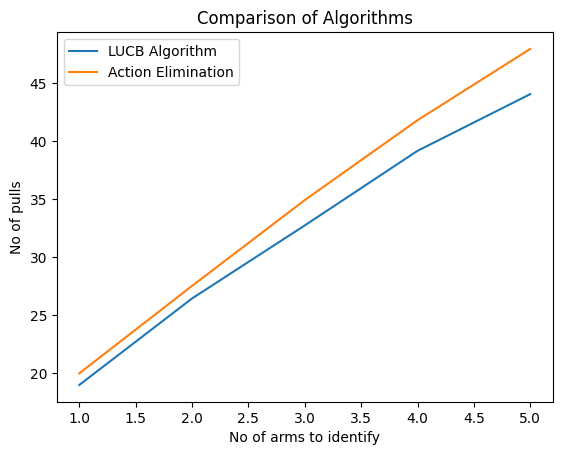

In [ ]:
import matplotlib.pyplot as plt

x = [1,2,3,4,5]
plt.plot(x, ans_lucb, label = "LUCB Algorithm")
plt.plot(x, ans_vanila, label = "Action Elimination")
# plt.plot(x, ans, label = "Smart bound")

plt.xlabel('No of arms to identify')
plt.ylabel('No of pulls')
plt.title('Comparison of Algorithms')
plt.legend()
plt.show()

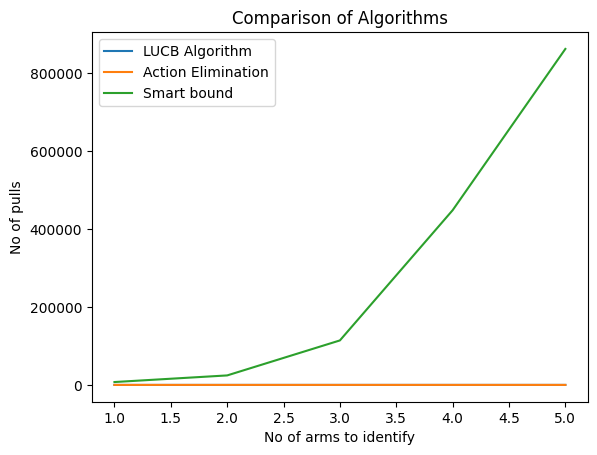

In [ ]:
import matplotlib.pyplot as plt

x = [1,2,3,4,5]
plt.plot(x, ans_lucb, label = "LUCB Algorithm")
plt.plot(x, ans_vanila, label = "Action Elimination")
plt.plot(x, ans, label = "Smart bound")

plt.xlabel('No of arms to identify')
plt.ylabel('No of pulls')
plt.title('Comparison of Algorithms')
plt.legend()
plt.show()

#Rough

In [ ]:
import math
import numpy as np
np.random.seed(8)

def pull(mean):
    return np.random.normal(mean, 1)

def epsilon(R):
    return (2**(-R))/4

def delta_R(R,delta,N):
    return (6*delta)/(((3.14*R)**2)*N)

def T_R(R,delta,N):
    return (2/(epsilon(R)**2))*math.log(2/delta_R(R,delta,N))

def check_true(required,cluster,Arms):
    count=0
    for i in Arms:
        if i[1]==-1:
            count+=1
    if count==len(Arms):
        return False
    for i in required:
        if i>0:
            return True
    return False

def update(cluster,required,R,u_cap):
    t=0
    j=0
    while(j<len(u_cap) and u_cap[j][1]==-1):
        j+=1
    i=0
    upper=0
    if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
        upper=math.inf
    else:
        upper=u_cap[cluster[t]+j+i-1][0]
    lower=-math.inf

    for i in range(j,len(u_cap)):
        if u_cap[i][1]!=-1:
            if t<len(cluster) and i==cluster[t]+j:
                t+=1
                lower=u_cap[i-1][0]
                if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
                    upper=math.inf
                else:
                    upper=u_cap[cluster[t]+j+i-1][0]
            if (u_cap[i][0]>=lower+epsilon(R) or lower==u_cap[i][0]) and (u_cap[i][0]<=upper-epsilon(R) or u_cap[i][0]==upper):
                u_cap[i][1]=-1
                if t<len(cluster):
                    required[t]-=1
                    cluster[t]-=1
    return u_cap,required,cluster

def update_u_cap(R,mean,delta,N,u_cap):
    u_now=0
    num_pulls=T_R(R,delta,N)
    if R>1:
        num_previous=T_R(R-1,delta,N)
        to_pull=int(num_pulls-num_previous)
    else:
        num_previous=0
        to_pull=int(T_R(R,delta,N))
    count=0
    for i in range(to_pull):
        u_now+=pull(mean)
        count+=1
    return (u_now+u_cap*num_previous)/(num_pulls),count

def smart_algo(delta,cluster,required,Arms):
    Arms.sort

    u_cap=[[pull(i),i] for i in Arms]
    count=0
    R=0
    while(check_true(required,cluster,u_cap)):
        u_cap.sort(key=lambda x:x[0])
        R+=1
        for i in range(len(Arms)):
            # if u_cap[i][1]!=-1:
            u_cap[i][0],c=update_u_cap(R,u_cap[i][1],delta,len(Arms),u_cap[i][0])
            count+=c
                # print(count,"-----count")
                # print(c,"c is here")
        u_cap,required, cluster=update(cluster,required,R,u_cap)
    u_cap,required, cluster=update(cluster,required,R,u_cap)
    return count

ans_smart=[]
ans=[]
for i in range(1):
    Arms=[0.11,0.14,0.85,0.8,0.1,0.17,0.7,0.85,0.75,0.89]
    cluster=[5,5]
    required=[i+1,0]
    delta=0.1
    ans.append(smart_algo(delta,cluster,required,Arms))
    # print(ans)
print(ans)

# for i in range(5):
#     ans=0
#     for j in range(1000):
#         Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
#         cluster=[5,5]
#         required=[i+1,0]
#         delta=0.1
#         ans+=smart_algo(delta,cluster,required,Arms)
#         print(i,j)
#     ans_smart.append(ans/1000)

print(ans_smart)
# ans=[7410.0, 24379.87, 114086.77, 447902.81, 861415.5]


[7410]
[]


In [1]:
import pandas as pd


In [2]:
data=pd.read_csv('/Users/aniket/Documents/RAI/rating.csv')

In [3]:
d={}
data.sort_values("movieId")
data=data.iloc[:10000]
for i in data.index:
    # print(data['movieId'][i])

    if data['movieId'][i] not in d.keys():
        d[data['movieId'][i]]=[data['rating'][i]]
    else:
        d[data['movieId'][i]].append(data['rating'][i])

data.head()

,userId,movieId,rating,timestamp
0,1,2,3.5,2005-04-02 23:53:47
1,1,29,3.5,2005-04-02 23:31:16
2,1,32,3.5,2005-04-02 23:33:39
3,1,47,3.5,2005-04-02 23:32:07
4,1,50,3.5,2005-04-02 23:29:40


In [4]:
# prompt: write code to iterate over dataframe and print rating corresponding to movie id
print(d)


{2: [3.5, 3.0, 3.0, 3.0, 3.0, 3.0, 1.0, 3.5], 29: [3.5, 3.0, 5.0, 4.0], 32: [3.5, 4.0, 1.0, 5.0, 3.0, 5.0, 2.0, 4.0, 5.0, 4.0, 3.5, 3.0, 4.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 3.5, 3.5, 4.0], 47: [3.5, 5.0, 5.0, 4.0, 5.0, 4.0, 3.0, 4.0, 4.5, 4.0, 3.0, 5.0, 4.0, 3.0, 3.0, 4.0, 4.0, 5.0, 4.0, 4.0, 5.0, 4.0, 5.0, 5.0, 4.0, 5.0, 4.5, 4.0], 50: [3.5, 5.0, 3.0, 5.0, 4.0, 5.0, 5.0, 3.5, 5.0, 4.0, 5.0, 5.0, 3.0, 4.0, 5.0, 5.0, 5.0, 5.0, 4.0, 5.0, 5.0, 4.0, 4.0, 4.0, 5.0, 4.0, 5.0, 3.5], 112: [3.5, 5.0, 2.0, 4.0, 2.0, 4.0, 3.0, 2.0], 151: [4.0, 3.0, 3.0, 3.0, 3.0, 4.0, 5.0, 5.0, 0.5, 4.0], 223: [4.0, 5.0, 3.0, 3.0, 5.0, 5.0, 4.5, 1.0, 5.0, 3.0, 5.0, 4.0, 4.5, 5.0, 3.0, 4.5, 1.5], 253: [4.0, 4.0, 4.5, 5.0, 5.0, 3.5, 3.0, 3.0, 5.0, 4.5, 3.0, 3.0, 3.0, 5.0, 5.0, 4.0, 3.0, 5.0, 4.5, 3.0], 260: [4.0, 5.0, 5.0, 5.0, 4.0, 5.0, 4.0, 5.0, 4.0, 4.0, 1.0, 5.0, 5.0, 5.0, 4.0, 3.0, 5.0, 4.5, 3.5, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 3.0, 4.0, 4.5, 5.0, 5.0, 4.5, 2.5, 3.5, 4.5], 293: [4.0, 2.0, 5.0, 4.0, 5.0,

In [5]:
# data=data.drop(columns='timestamp')
data_to_use={}
for i in d.keys():
    if len(d[i])>10:
        data_to_use[i]=d[i]
print(len(d))
print(len(data_to_use))
print(data_to_use)

# data_grouped=data.groupby('movieId')

2889
184
{32: [3.5, 4.0, 1.0, 5.0, 3.0, 5.0, 2.0, 4.0, 5.0, 4.0, 3.5, 3.0, 4.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 3.5, 3.5, 4.0], 47: [3.5, 5.0, 5.0, 4.0, 5.0, 4.0, 3.0, 4.0, 4.5, 4.0, 3.0, 5.0, 4.0, 3.0, 3.0, 4.0, 4.0, 5.0, 4.0, 4.0, 5.0, 4.0, 5.0, 5.0, 4.0, 5.0, 4.5, 4.0], 50: [3.5, 5.0, 3.0, 5.0, 4.0, 5.0, 5.0, 3.5, 5.0, 4.0, 5.0, 5.0, 3.0, 4.0, 5.0, 5.0, 5.0, 5.0, 4.0, 5.0, 5.0, 4.0, 4.0, 4.0, 5.0, 4.0, 5.0, 3.5], 223: [4.0, 5.0, 3.0, 3.0, 5.0, 5.0, 4.5, 1.0, 5.0, 3.0, 5.0, 4.0, 4.5, 5.0, 3.0, 4.5, 1.5], 253: [4.0, 4.0, 4.5, 5.0, 5.0, 3.5, 3.0, 3.0, 5.0, 4.5, 3.0, 3.0, 3.0, 5.0, 5.0, 4.0, 3.0, 5.0, 4.5, 3.0], 260: [4.0, 5.0, 5.0, 5.0, 4.0, 5.0, 4.0, 5.0, 4.0, 4.0, 1.0, 5.0, 5.0, 5.0, 4.0, 3.0, 5.0, 4.5, 3.5, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 3.0, 4.0, 4.5, 5.0, 5.0, 4.5, 2.5, 3.5, 4.5], 293: [4.0, 2.0, 5.0, 4.0, 5.0, 5.0, 3.0, 3.0, 3.0, 4.0, 4.0], 296: [4.0, 5.0, 3.5, 5.0, 3.0, 4.0, 5.0, 5.0, 5.0, 5.0, 4.0, 5.0, 5.0, 5.0, 5.0, 3.0, 5.0, 1.0, 4.5, 4.0, 4.0, 5.0, 4.0, 5.0, 5.0, 5.0

In [6]:
import numpy as np

true_mean={}
for i in data_to_use.keys():
    true_mean[i]=np.average(data_to_use[i])
print(true_mean)

{32: 3.8333333333333335, 47: 4.196428571428571, 50: 4.410714285714286, 223: 3.8823529411764706, 253: 4.0, 260: 4.25, 293: 3.8181818181818183, 296: 4.25, 318: 4.511904761904762, 337: 3.5625, 367: 3.3125, 541: 4.305555555555555, 589: 4.203125, 593: 4.083333333333333, 924: 4.0, 1036: 4.230769230769231, 1079: 3.9, 1080: 3.6785714285714284, 1089: 4.117647058823529, 1090: 4.071428571428571, 1097: 4.214285714285714, 1136: 4.25, 1193: 4.3, 1196: 4.517857142857143, 1198: 4.12962962962963, 1200: 4.0, 1208: 4.472222222222222, 1214: 3.9375, 1215: 3.772727272727273, 1222: 4.09375, 1240: 4.25, 1246: 3.8181818181818183, 1258: 4.541666666666667, 1259: 3.9722222222222223, 1262: 4.136363636363637, 1278: 3.909090909090909, 1291: 4.052631578947368, 1304: 4.461538461538462, 1358: 4.071428571428571, 1387: 3.78125, 1584: 3.3461538461538463, 2291: 3.857142857142857, 2628: 3.4375, 2683: 3.5, 2716: 3.638888888888889, 2762: 4.375, 2918: 3.590909090909091, 2959: 3.977272727272727, 3996: 4.461538461538462, 4226: 4

One of top 5 

In [24]:
import math
import numpy as np
# np.random.seed(8)
import random

def pull(key):
    return random.choice(data_to_use[key])
    # return np.random.normal(mean, 1)

def epsilon(R):
    return (2**(-R))/4

def delta_R(R,delta,N):
    return (6*delta)/(((3.14*R)**2)*N)

def T_R(R,delta, N):
  epsilon_R = (2**(-R))/4
  return (2/epsilon_R**2)*np.log((R**2 * N * np.pi**2)/(3*delta))


def check_true(required,cluster,Arms):
    # count=0
    # for i in Arms:
    #     if i[1]==-1:
    #         count+=1
    # if count==len(Arms):
    #     return False
    for i in required:
        if i>0:
            return True
    return False

def update(cluster,required,R,u_cap):
    t=0
    j=0
    while(j<len(u_cap) and u_cap[j][1]==-1):
        j+=1
    i=0
    upper=0
    if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
        upper=math.inf
    else:
        upper=u_cap[cluster[t]+j+i-1][0]

    lower=-math.inf

    for i in range(j,len(u_cap)):
        if u_cap[i][1]!=-1:
            if t<len(cluster) and i==cluster[t]+j:
                t+=1
                lower=u_cap[i-1][0]
                if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
                    upper=math.inf
                else:
                    upper=u_cap[cluster[t]+j+i-1][0]
            if (u_cap[i][0]>=lower+epsilon(R) or lower==u_cap[i][0]) and (u_cap[i][0]<=upper-epsilon(R) or u_cap[i][0]==upper):
                u_cap[i][1]=-1
                if t<len(cluster):
                    required[t]-=1
                    cluster[t]-=1
    return u_cap,required,cluster

def update2(cluster,required,R,u_cap):
    j=0
    t=0
    c=0
    cluster_temp=[]
    upper=math.inf
    lower=u_cap[cluster[j]][0]
    for i in range(len(u_cap)):
        if j<len(cluster) and i<cluster[j]+t:
            if u_cap[i][0]-lower>=epsilon(R) and upper-u_cap[i][0]>=epsilon(R):
                # print(u_cap[i][1])
                u_cap[i][1]=-1
                c+=1
        elif j<len(cluster) and i==cluster[j]+t:

            upper=u_cap[t+cluster[j]][0]
            if (j+1)<len(cluster):
                lower=u_cap[t+cluster[j+1]][0]
            t+=cluster[j]
            j+=1
            cluster_temp.append(c)
            c=0
    if len(cluster_temp)<len(cluster):
        cluster_temp.append(c)
    # print("cluster_temp----",cluster_temp)
    # print("cluster----",cluster)
    # print("required----",required)
    for i in range(len(cluster)):
        cluster[i]-=cluster_temp[i]
        required[i]-=cluster_temp[i]

    return u_cap,required,cluster


def update_u_cap(R,mean,delta,N,u_cap):
    u_now=0
    num_pulls=T_R(R,delta,N)
    if R>3:
        num_previous=T_R(R-1,delta,N)
        to_pull=int(num_pulls-num_previous)
    else:
        num_previous=0
        to_pull=int(T_R(1,delta,N))
    count=0
    for i in range(to_pull):
        u_now+=pull(mean)
        count+=1
    return (u_now+u_cap*num_previous)/(num_pulls),count

def smart_algo(delta,cluster,required,Arms):
    u_cap=[[pull(i),i] for i in Arms.keys()]
    count=0
    R=0
    while(check_true(required,cluster,u_cap)):
        u_cap.sort(key=lambda x:x[0],reverse=True)
        R+=1
        print(u_cap)
        for i in range(len(Arms)):
            if u_cap[i][1]!=-1:
                u_cap[i][0],c=update_u_cap(R,u_cap[i][1],delta,len(Arms),u_cap[i][0])
                count+=c
        u_cap,required, cluster=update2(cluster,required,R,u_cap)
    u_cap,required, cluster=update2(cluster,required,R,u_cap)
    return count

ans_smart=[]
ans=0
for i in range(10):
    
    # Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
    Arms=data_to_use
    # Arms=[0.9, 0.85, 0.7, 0.65, 0.66, 0.6, 0.4, 0.35, 0.2, 0.15]
    cluster=[5,174]
    required=[1,0]
    delta=0.01
    ans+=smart_algo(delta,cluster,required,Arms)
ans_smart=ans/10
print(ans_smart)


[[5.0, 32], [5.0, 47], [5.0, 50], [5.0, 223], [5.0, 293], [5.0, 318], [5.0, 589], [5.0, 1136], [5.0, 1193], [5.0, 1198], [5.0, 1240], [5.0, 1304], [5.0, 1358], [5.0, 2762], [5.0, 4306], [5.0, 5952], [5.0, 62], [5.0, 266], [5.0, 1210], [5.0, 3753], [5.0, 329], [5.0, 858], [5.0, 1213], [5.0, 1242], [5.0, 1247], [5.0, 1307], [5.0, 2028], [5.0, 6], [5.0, 165], [5.0, 356], [5.0, 1393], [5.0, 16], [5.0, 357], [5.0, 1265], [5.0, 2396], [5.0, 3578], [5.0, 349], [5.0, 25], [5.0, 1527], [5.0, 474], [5.0, 2997], [5.0, 1704], [5.0, 3147], [5.0, 555], [4.5, 296], [4.5, 337], [4.5, 1097], [4.5, 1246], [4.5, 1262], [4.5, 1291], [4.5, 953], [4.5, 1073], [4.5, 1230], [4.5, 17], [4.5, 2324], [4.0, 541], [4.0, 924], [4.0, 1036], [4.0, 1079], [4.0, 1080], [4.0, 1090], [4.0, 1200], [4.0, 1208], [4.0, 1214], [4.0, 1222], [4.0, 1258], [4.0, 1259], [4.0, 1278], [4.0, 1387], [4.0, 2291], [4.0, 2628], [4.0, 2683], [4.0, 2716], [4.0, 2918], [4.0, 2959], [4.0, 3996], [4.0, 4993], [4.0, 7153], [4.0, 1270], [4.0, 1

Best arm 

In [27]:

ans=0
for i in range(10):
    #print the round numbers
    # print("Intereation no: --------------------------------",i)
    # Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
    Arms=data_to_use
    # Arms=[0.9, 0.85, 0.7, 0.65, 0.66, 0.6, 0.4, 0.35, 0.2, 0.15]
    cluster=[2,182]
    required=[1,0]
    delta=0.01
    ans+=smart_algo(delta,cluster,required,Arms)
ans_smart=ans/10
print(ans_smart)

[[5.0, 50], [5.0, 223], [5.0, 293], [5.0, 367], [5.0, 541], [5.0, 593], [5.0, 1089], [5.0, 1136], [5.0, 1196], [5.0, 1208], [5.0, 1214], [5.0, 1240], [5.0, 1258], [5.0, 1259], [5.0, 1262], [5.0, 1387], [5.0, 3996], [5.0, 4993], [5.0, 7153], [5.0, 1270], [5.0, 2858], [5.0, 457], [5.0, 953], [5.0, 1247], [5.0, 1676], [5.0, 1721], [5.0, 17], [5.0, 150], [5.0, 508], [5.0, 588], [5.0, 736], [5.0, 912], [5.0, 39], [5.0, 292], [5.0, 4973], [5.0, 34], [5.0, 1784], [5.0, 3147], [4.5, 589], [4.5, 1213], [4.5, 2329], [4.5, 368], [4.5, 364], [4.5, 608], [4.5, 339], [4.5, 597], [4.5, 1617], [4.5, 2396], [4.5, 2023], [4.0, 32], [4.0, 318], [4.0, 1079], [4.0, 1097], [4.0, 1193], [4.0, 1200], [4.0, 1222], [4.0, 1246], [4.0, 1291], [4.0, 2291], [4.0, 2762], [4.0, 2959], [4.0, 266], [4.0, 329], [4.0, 440], [4.0, 788], [4.0, 1094], [4.0, 1127], [4.0, 1206], [4.0, 1221], [4.0, 1230], [4.0, 1242], [4.0, 2916], [4.0, 350], [4.0, 587], [4.0, 590], [4.0, 595], [4.0, 648], [4.0, 1393], [4.0, 16], [4.0, 357], [

In [2]:
import numpy as np
import random
import matplotlib.pyplot as plt
import math
from array import *

np.random.seed(1)

def pull(mean):
    return np.random.binomial(1, mean)

# def pull(mean):
#     return np.random.normal(mean, 1)
def num_pulls(delta, N, R):
  epsilon_R = (2**(-R))/4
  return (2/epsilon_R**2)*np.log((R**2 * N * np.pi**2)/(3*delta))

def remove_common(a, b):
  for i in a[:]:
      if i in b:
          a.remove(i)
  return a

def argmax(iterable):
    return max(enumerate(iterable), key=lambda x: x[1])[0]

def argmin(iterable):
    return min(enumerate(iterable), key=lambda x: x[1])[0]

def extract(lst):
    return [item[0] for item in lst]

def extract1(lst):
    return [item[1] for item in lst]

def instance(R,N,delta):
    epsilon_R = (2**(-R))/4
    value = np.sqrt(np.log((2*np.pi**2*N*np.log((np.pi**2*R**2*N)/(3*delta))*np.log((np.pi**2*R**2*N)/(3*delta)))/(3*delta*epsilon_R**4))/(4*np.log((np.pi**2*R**2*N)/(3*delta))))
    return epsilon_R, epsilon_R*value

In [3]:
def alpha(N,t,delta):
    alpha=np.sqrt(np.log((((np.pi*t)**2)*N)/(3*delta))/(2*t))
    return alpha


np.random.seed(1)
arm = [[0.3,1,0,0,-10,10],[0.4,1,0,0,-10,10],[0.6,1,0,0,-10,10],[0.8,1,0,0,-10,10],[0.1,1,0,0,-10,10],[0.35,1,0,0,-10,10],[0.65,1,0,0,-10,10],[0.85,1,0,0,-10,10],[0.15,1,0,0,-10,10],[0.36,1,0,0,-10,10]]
temp_arm = sorted(arm,key=lambda x:x[0], reverse=True)
# print(temp_arm)
total_time = 0
a,b,c = 0,5,3
R_max = 0
R_min = 100
R_1,R_2,R_3,R_4,R_5,R_m = 0,0,0,0,0,0
for k in range(1,2):
  # print("--------------------------------------------------------------------------------------------------------------------------------------------")
  arm = [[0.3,1,0,0,-10,10],[0.4,1,0,0,-10,10],[0.6,1,0,0,-10,10],[0.8,1,0,0,-10,10],[0.1,1,0,0,-10,10],[0.35,1,0,0,-10,10],[0.65,1,0,0,-10,10],[0.85,1,0,0,-10,10],[0.15,1,0,0,-10,10],[0.36,1,0,0,-10,10]]
  temp_arm = sorted(arm,key=lambda x:x[0], reverse=True)
  cluster_size = [2,5,3]
  required_arms = [a,b,c]
  temp_cluster_size = [2,5,3]
  A_1 = []
  A_2 = []
  A_3 = []
  others1 = []
  others2 = []
  N = len(arm)
  delta = 10**(-2)
  R = 0
  emp_order = temp_arm
  while(len(A_1)<required_arms[0] or len(A_2)<required_arms[1] or len(A_3)<required_arms[2]):
    # print("round----------------------",R)
    R = R + 1
    epsilon_R = (2**(-R))/4
    if R == 1:
      pulls = int(num_pulls(delta, N, R))
    else:
      pulls = int(num_pulls(delta, N, R))-int(num_pulls(delta, N, R-1))
    # print("pulls = ",pulls)  
    for _ in range(pulls):
      # print(emp_order)
      # reward=[0 for i in range(len(emp_order))]
      for i in range(len(emp_order)):
        print(emp_order[i])
        emp_order[i][1] = emp_order[i][1] + 1
        reward=pull(emp_order[i][0])
        emp_order[i][2] = emp_order[i][2] + reward
        print("reward",reward)
        emp_order[i][3] = emp_order[i][2]/emp_order[i][1]
    emp_order = sorted(emp_order,key=lambda x:x[3], reverse=True)
    for i in range(temp_cluster_size[0]):
      print(emp_order[i][3])
      print(emp_order[temp_cluster_size[0]][3])
      print(epsilon_R)
      if len(A_1)<required_arms[0] or len(A_2)<required_arms[1]:
        print("here")
        if emp_order[i][3]-emp_order[temp_cluster_size[0]][3] > epsilon_R:
          A_1.append(emp_order[i])
          print(A_1)
      else:
        if emp_order[i][3]-emp_order[temp_cluster_size[0]+temp_cluster_size[1]][3] > epsilon_R:
          others1.append(emp_order[i])
    emp_order = remove_common(emp_order, A_1)
    emp_order = remove_common(emp_order, others1)
    temp_cluster_size[0] = cluster_size[0] - len(A_1) - len(others1)
    for i in range(temp_cluster_size[0], temp_cluster_size[0] + temp_cluster_size[1]):
      try:
        if temp_cluster_size[0] == 0:
          # print("emp order-----",emp_order)
          # print("temp cluster-------",temp_cluster_size)
          # print("--------------------------------")
          if emp_order[i][3] - emp_order[temp_cluster_size[0] + temp_cluster_size[1]][3] > epsilon_R:
            A_2.append(emp_order[i])
        elif temp_cluster_size[2] == 0:
          if emp_order[temp_cluster_size[0]-1][3] - emp_order[i][3] > epsilon_R:
            A_2.append(emp_order[i])
        else:
          if emp_order[i][3] - emp_order[temp_cluster_size[0] + temp_cluster_size[1]][3] > epsilon_R and emp_order[temp_cluster_size[0]-1][3] - emp_order[i][3] > epsilon_R:
            A_2.append(emp_order[i])
        emp_order = remove_common(emp_order, A_2)
        temp_cluster_size[1] = cluster_size[1] - len(A_2)
      except:
        break
    for i in range(temp_cluster_size[0] + temp_cluster_size[1], temp_cluster_size[0] + temp_cluster_size[1] + temp_cluster_size[2]):
      if len(A_3)<required_arms[2] or len(A_2)<required_arms[1]:
        if emp_order[temp_cluster_size[0] + temp_cluster_size[1]-1][3] - emp_order[i][3] > epsilon_R:
          A_3.append(emp_order[i])
      else:
        if emp_order[temp_cluster_size[0]-1][3] - emp_order[i][3] > epsilon_R:
          others2.append(emp_order[i])
    emp_order = remove_common(emp_order, A_3)
    emp_order = remove_common(emp_order, others2)
    print(emp_order)
    temp_cluster_size[2] = cluster_size[2] - len(A_3) - len(others2)
    if temp_cluster_size[0] == 0 and temp_cluster_size[1] == 0:
      A_3.append(emp_order)
    if temp_cluster_size[0] == 0 and temp_cluster_size[2] == 0:
      A_2.append(emp_order)
    if temp_cluster_size[1] == 0 and temp_cluster_size[2] == 0:
      A_1.append(emp_order)
  # print("round--------------------------------------------------------",R)   
  # print("arm------------------------------------\n",emp_order) 
  if R < R_min:
    R_min = R
  if R > R_max:
    R_max = R
  if R == 1:
    R_1 = R_1 +1
  elif R == 2:
    R_2 = R_2 +1
  elif R == 3:
    R_3 = R_3 +1
  elif R == 4:
    R_4 = R_4 +1
  elif R == 5:
    R_5 = R_5 +1
  else:
    R_m = R_m +1
  # print("temp_arm--------------",temp_arm)  
  for i in range(len(temp_arm)):
    total_time = total_time + temp_arm[i][1]
print(total_time/k)
print()



[0.85, 1, 0, 0, -10, 10]
reward 1
[0.8, 1, 0, 0, -10, 10]
reward 1
[0.65, 1, 0, 0, -10, 10]
reward 1
[0.6, 1, 0, 0, -10, 10]
reward 1
[0.4, 1, 0, 0, -10, 10]
reward 0
[0.36, 1, 0, 0, -10, 10]
reward 0
[0.35, 1, 0, 0, -10, 10]
reward 0
[0.3, 1, 0, 0, -10, 10]
reward 0
[0.15, 1, 0, 0, -10, 10]
reward 0
[0.1, 1, 0, 0, -10, 10]
reward 0
[0.85, 2, 1, 0.5, -10, 10]
reward 1
[0.8, 2, 1, 0.5, -10, 10]
reward 1
[0.65, 2, 1, 0.5, -10, 10]
reward 1
[0.6, 2, 1, 0.5, -10, 10]
reward 0
[0.4, 2, 0, 0.0, -10, 10]
reward 0
[0.36, 2, 0, 0.0, -10, 10]
reward 1
[0.35, 2, 0, 0.0, -10, 10]
reward 0
[0.3, 2, 0, 0.0, -10, 10]
reward 0
[0.15, 2, 0, 0.0, -10, 10]
reward 0
[0.1, 2, 0, 0.0, -10, 10]
reward 0
[0.85, 3, 2, 0.6666666666666666, -10, 10]
reward 1
[0.8, 3, 2, 0.6666666666666666, -10, 10]
reward 0
[0.65, 3, 2, 0.6666666666666666, -10, 10]
reward 1
[0.6, 3, 1, 0.3333333333333333, -10, 10]
reward 0
[0.4, 3, 0, 0.0, -10, 10]
reward 1
[0.36, 3, 1, 0.3333333333333333, -10, 10]
reward 1
[0.35, 3, 0, 0.0, -10,

In [7]:
print(num_pulls(0.01, 10, 1))
print(num_pulls(0.01, 10, 2))
print(num_pulls(0.01, 10, 3))
print(num_pulls(0.01, 10, 3)+num_pulls(0.01, 10, 1)+num_pulls(0.01, 10, 2))

1036.621153537642
4856.267327043952
21085.85439098685
26978.742871568444


In [43]:
import math
import numpy as np
np.random.seed(1)
# from debug import Update

def pull(mean):
    # if mean==-1:
    #     return np.random.binomial(1, 0.5)
    return np.random.binomial(1, mean)

# def pull(mean):
#     return np.random.normal(mean, 1)

def epsilon(R):
    return (2**(-R))/4

def delta_R(R,delta,N):
    return (6*delta)/(((3.14*R)**2)*N)

def T_R(R,delta, N):
  epsilon_R = (2**(-R))/4
  return (2/epsilon_R**2)*np.log((R**2 * N * np.pi**2)/(3*delta))


def check_true(required,cluster,Arms):
    count=0
    for i in Arms:
        if i[1]==-1:
            count+=1
    if count==len(Arms):
        return False
    for i in required:
        if i>0:
            return True
    return False

def remove_common(a, b):
  for i in a[:]:
      if i in b:
          a.remove(i)
  return a

# def update(cluster,required,R,u_cap):
#     t=0
#     j=0
#     while(j<len(u_cap) and u_cap[j][1]==-1):
#         j+=1
#     i=0
#     upper=0
#     if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
#         upper=math.inf
#     else:
#         upper=u_cap[cluster[t]+j+i-1][0]

#     lower=-math.inf

#     for i in range(j,len(u_cap)):
#         if u_cap[i][1]!=-1:
#             if t<len(cluster) and i==cluster[t]+j:
#                 t+=1
#                 lower=u_cap[i-1][0]
#                 if t>=len(cluster) or (cluster[t]+j+i-1)>=len(u_cap):
#                     upper=math.inf
#                 else:
#                     upper=u_cap[cluster[t]+j+i-1][0]
#             if (u_cap[i][0]>=lower+epsilon(R) or lower==u_cap[i][0]) and (u_cap[i][0]<=upper-epsilon(R) or u_cap[i][0]==upper):
#                 u_cap[i][1]=-1
#                 if t<len(cluster):
#                     required[t]-=1
#                     cluster[t]-=1
#     return u_cap,required,cluster

def update2(cluster,required,R,u_cap):
    j=0
    t=0
    c=0
    cluster_temp=[]
    upper=math.inf
    lower=u_cap[cluster[j]][0]
    
    for i in range(len(u_cap)):
        # print(i,c)
        print(u_cap[i][0])
        print(lower)
        print(upper)
        print(epsilon(R))
        print("----------------------------------------------------------------------------------------------")
        if j<len(cluster) and i<cluster[j]+t:
            if u_cap[i][0]-lower>epsilon(R) and upper-u_cap[i][0]>epsilon(R) and u_cap[i][1]!=-1:
                # print(u_cap[i][1])
                u_cap[i][1]=-1
                c+=1
        elif j<len(cluster) and i==cluster[j]+t:
            if t+cluster[j]==0:
                upper==math.inf
            else:    
                upper=u_cap[t+cluster[j]-1][0]
            t+=cluster[j]
            if (j+1)<len(cluster) and t+cluster[j+1]<len(u_cap):
                lower=u_cap[t+cluster[j+1]][0]
            else:
                lower=-math.inf 
            j+=1
            cluster_temp.append(c)
            c=0
            if u_cap[i][0]-lower>epsilon(R) and upper-u_cap[i][0]>epsilon(R) and u_cap[i][1]!=-1:
                u_cap[i][1]=-1
                c+=1
    if len(cluster_temp)<len(cluster):
        cluster_temp.append(c)
    for i in range(len(cluster)):
        # cluster[i]-=cluster_temp[i]
        required[i]-=cluster_temp[i]

    return u_cap,required,cluster


# def update_u_cap(R,mean,delta,N,u_cap):
#     # u_now=0
#     # num_pulls=T_R(R,delta,N)
#     # if R>1:
#     num_previous=T_R(R-1,delta,N)
#     #     to_pull=int(num_pulls)-int(num_previous)
#     # else:
#     #     num_previous=0
#     #     to_pull=int(T_R(1,delta,N))
#     # count=0
#     # print(to_pull)
#     # for i in range(to_pull):
#         reward=pull(mean)
#         u_now+=reward
#         # print(reward)
#         count+=1
#     print(mean)    
#     print(u_now)    
#     return (u_now+u_cap*(num_previous))/(num_pulls),count
#     return (pull(mean)+)

def smart_algo(delta,cluster,required,Arms):
    
    u_cap=[[0,1,i,1,0] for i in Arms]
    u_cap.sort(key=lambda x:x[2],reverse=True)
    count=len(Arms)
    R=0
    while(check_true(required,cluster,u_cap)):
        R+=1
        num_pulls=T_R(R,delta,len(Arms))
        if R>1:
            num_previous=T_R(R-1,delta,len(Arms))
            to_pull=int(num_pulls)-int(num_previous)
        else:
            num_previous=0
            to_pull=int(T_R(1,delta,len(Arms)))
        # if R==4:
        #     return count
        for _ in range(to_pull):
            for i in range(len(Arms)):
                
                if u_cap[i][1]!=-1:
                    print(u_cap[i])
                    reward=pull(u_cap[i][2])
                    print(reward)
                    u_cap[i][4]+=reward
                    u_cap[i][3]+=1
                    u_cap[i][0]=u_cap[i][4]/u_cap[i][3]
                    count+=1
            #     break 
        # break   
        u_cap.sort(key=lambda x:x[0],reverse=True)
        u_cap,required, cluster=update2(cluster,required,R,u_cap)
        print(u_cap)

    u_cap,required, cluster=update2(cluster,required,R,u_cap)
    return count


def butterscotch(Arms,cluster,required,delta):
    return smart_algo(delta,cluster,required,Arms)



In [44]:
pulls_butterscotch=0

np.random.seed(1)
for i in range(1):
    Arms=[0.3,0.4,0.6,0.8,0.1,0.35,0.65,0.85,0.15,0.36]
    cluster=[3,5,2]
    required=[3,5,0]
    delta=0.01

    # print(required)
    pulls_butterscotch+=butterscotch(Arms,cluster,required,delta)
print("No of pulls for butterscotch------------------------",pulls_butterscotch/1)


[0, 1, 0.85, 1, 0]
1
[0, 1, 0.8, 1, 0]
1
[0, 1, 0.65, 1, 0]
1
[0, 1, 0.6, 1, 0]
1
[0, 1, 0.4, 1, 0]
0
[0, 1, 0.36, 1, 0]
0
[0, 1, 0.35, 1, 0]
0
[0, 1, 0.3, 1, 0]
0
[0, 1, 0.15, 1, 0]
0
[0, 1, 0.1, 1, 0]
0
[0.5, 1, 0.85, 2, 1]
1
[0.5, 1, 0.8, 2, 1]
1
[0.5, 1, 0.65, 2, 1]
1
[0.5, 1, 0.6, 2, 1]
0
[0.0, 1, 0.4, 2, 0]
0
[0.0, 1, 0.36, 2, 0]
1
[0.0, 1, 0.35, 2, 0]
0
[0.0, 1, 0.3, 2, 0]
0
[0.0, 1, 0.15, 2, 0]
0
[0.0, 1, 0.1, 2, 0]
0
[0.6666666666666666, 1, 0.85, 3, 2]
1
[0.6666666666666666, 1, 0.8, 3, 2]
0
[0.6666666666666666, 1, 0.65, 3, 2]
1
[0.3333333333333333, 1, 0.6, 3, 1]
0
[0.0, 1, 0.4, 3, 0]
1
[0.3333333333333333, 1, 0.36, 3, 1]
1
[0.0, 1, 0.35, 3, 0]
0
[0.0, 1, 0.3, 3, 0]
0
[0.0, 1, 0.15, 3, 0]
0
[0.0, 1, 0.1, 3, 0]
0
[0.75, 1, 0.85, 4, 3]
1
[0.5, 1, 0.8, 4, 2]
1
[0.75, 1, 0.65, 4, 3]
0
[0.25, 1, 0.6, 4, 1]
1
[0.25, 1, 0.4, 4, 1]
1
[0.5, 1, 0.36, 4, 2]
0
[0.0, 1, 0.35, 4, 0]
1
[0.0, 1, 0.3, 4, 0]
1
[0.0, 1, 0.15, 4, 0]
0
[0.0, 1, 0.1, 4, 0]
0
[0.8, 1, 0.85, 5, 4]
0
[0.6, 1, 0.8, 5, 3

In [28]:
import numpy as np
np.random.seed(1)
print(np.random.normal(0.85, 1))
print(np.random.normal(0.8, 1))
print(np.random.normal(0.65, 1))
print(np.random.binomial(1,.6))
print(np.random.binomial(1,.4))

2.4743453636632418
0.18824358634992466
0.12182824773654433
1
0
